52545255552352


    <h2 style="text-align:center;font-size:200%;;">CNC milling machine - Tool Wear Detection</h2>
<h3  style="text-align:center;">Keywords : <span class="label label-success">IoT</span> <span class="label label-success">EDA</span> <span class="label label-success">Classification</span> <span class="label label-success">Causal Analysis</span> <span class="label label-success">FFT</span></h3>

# Table of Contents<a id='top'></a>

>1. [Overview](#1.-Overview)  
>   * [Project Detail](#Project-Detail)
>   * [Goal of this notebook](#Goal-of-this-notebook)
>1. [Import libraries](#2.-Import-libraries)
>1. [Load the dataset](#3.-Load-the-dataset)
>1. [Pre-processing](#4.-Pre-processing)
>1. [EDA](#5.-EDA)  
>    * [Basic Analysis](#Basic-Analysis)
>    * [Univariate Analysis](#Univariate-Analysis)
>    * [Multivariate Analysis](#Multivariate-Analysis)
>    * [Frequency Analysis](#Frequency-Analysis)
>1. [Modeling](#6.-Modeling)
>    * [Feature Engineering](#Feature-Engineering)
>    * [Case1 : Tool Condition](#Case1-:-Tool-Condition)
>    * [Case2 : Machining Finalized](#Case2-:-Machining-Finalized)
>    * [Case3 : Passed Visual Inspection](#Case3-:-Passed-Visual-Inspection)
>1. [Conclusion](#7.-Conclusion)
>1. [References](#8.-References)

# 1. Overview

## Project Detail
>In [this Dataset](https://www.kaggle.com/shasun/tool-wear-detection-in-cnc-mill), collected data in machining experiments are given. Machining data was collected from a CNC machine for variations of tool condition, feed rate, and clamping pressure. <br/>
><ul>
>    <li>feed rate</li>
>        <p>relative velocity of the cutting tool along the workpiece (mm/s)</p>
>    <li>clamping pressure</li>
>        <p>pressure used to hold the workpiece in the vise (bar)</p>
></ul>
>In 18 machining experiments, time series data was collected with a sampling rate of 100 ms from the 4 motors in the CNC (X, Y, Z axes and spindle).<br/>
>And output of each experiments includes tool condition (unworn and worn tools) and whether or not the tool passed visual inspection.<br/>
>We can enjoy this dataset for tool wear detection or detection of inadequate clamping.

## Goal of this notebook
>* Practice EDA technique
>* Practice visualising technique(especially using bokeh via holoviews)
>* Practice feature enginieering technique
>    * Lag features
>    * Differential feature
>* Practice modeling technique
>    * LightGBM
>* Causal analysis skill
>* Frequency analysis skill
>    * FFT

<a href="#top" class="btn btn-success btn-sm active" role="button" aria-pressed="true" style="color:white;">Table of Contents</a>

# 2. Import libraries

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
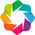

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import holoviews as hv
from holoviews import opts
hv.extension('bokeh')
from matplotlib import pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score
import os
from scipy import signal
import lightgbm as lgb
import shap

<a href="#top" class="btn btn-success btn-sm active" role="button" aria-pressed="true" style="color:white;">Table of Contents</a>

# 3. Load the dataset

In [2]:
for dirname, _, filenames in os.walk('/home/liu/Documents/data/tool_data/'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/home/liu/Documents/data/tool_data/experiment_12.csv
/home/liu/Documents/data/tool_data/experiment_09.csv
/home/liu/Documents/data/tool_data/experiment_02.csv
/home/liu/Documents/data/tool_data/experiment_08.csv
/home/liu/Documents/data/tool_data/experiment_06.csv
/home/liu/Documents/data/tool_data/experiment_16.csv
/home/liu/Documents/data/tool_data/experiment_14.csv
/home/liu/Documents/data/tool_data/experiment_18.csv
/home/liu/Documents/data/tool_data/experiment_10.csv
/home/liu/Documents/data/tool_data/train.csv
/home/liu/Documents/data/tool_data/test_artifact.jpg
/home/liu/Documents/data/tool_data/experiment_13.csv
/home/liu/Documents/data/tool_data/README.txt
/home/liu/Documents/data/tool_data/experiment_17.csv
/home/liu/Documents/data/tool_data/experiment_05.csv
/home/liu/Documents/data/tool_data/experiment_07.csv
/home/liu/Documents/data/tool_data/experiment_11.csv
/home/liu/Documents/data/tool_data/experiment_04.csv
/home/liu/Documents/data/tool_data/experiment_01.csv
/home/li

In [3]:
experiment_result = pd.read_csv("/home/liu/Documents/data/tool_data/train.csv")
print(f'train.csv : {experiment_result.shape}')
experiment_result.head(3)

train.csv : (18, 7)


,No,material,feedrate,clamp_pressure,tool_condition,machining_finalized,passed_visual_inspection
0,1,wax,6,4.0,unworn,yes,yes
1,2,wax,20,4.0,unworn,yes,yes
2,3,wax,6,3.0,unworn,yes,yes


In [4]:
experiment_tmp = pd.read_csv("/home/liu/Documents/data/tool_data/experiment_01.csv")
print(f'experiment_XX.csv : {experiment_tmp.shape}')
print(experiment_tmp.columns)
experiment_tmp.head(3)

experiment_XX.csv : (1055, 48)
Index(['X1_ActualPosition', 'X1_ActualVelocity', 'X1_ActualAcceleration',
       'X1_CommandPosition', 'X1_CommandVelocity', 'X1_CommandAcceleration',
       'X1_CurrentFeedback', 'X1_DCBusVoltage', 'X1_OutputCurrent',
       'X1_OutputVoltage', 'X1_OutputPower', 'Y1_ActualPosition',
       'Y1_ActualVelocity', 'Y1_ActualAcceleration', 'Y1_CommandPosition',
       'Y1_CommandVelocity', 'Y1_CommandAcceleration', 'Y1_CurrentFeedback',
       'Y1_DCBusVoltage', 'Y1_OutputCurrent', 'Y1_OutputVoltage',
       'Y1_OutputPower', 'Z1_ActualPosition', 'Z1_ActualVelocity',
       'Z1_ActualAcceleration', 'Z1_CommandPosition', 'Z1_CommandVelocity',
       'Z1_CommandAcceleration', 'Z1_CurrentFeedback', 'Z1_DCBusVoltage',
       'Z1_OutputCurrent', 'Z1_OutputVoltage', 'S1_ActualPosition',
       'S1_ActualVelocity', 'S1_ActualAcceleration', 'S1_CommandPosition',
       'S1_CommandVelocity', 'S1_CommandAcceleration', 'S1_CurrentFeedback',
       'S1_DCBusVoltage', 'S1

,X1_ActualPosition,X1_ActualVelocity,X1_ActualAcceleration,X1_CommandPosition,X1_CommandVelocity,X1_CommandAcceleration,X1_CurrentFeedback,X1_DCBusVoltage,X1_OutputCurrent,X1_OutputVoltage,...,S1_CurrentFeedback,S1_DCBusVoltage,S1_OutputCurrent,S1_OutputVoltage,S1_OutputPower,S1_SystemInertia,M1_CURRENT_PROGRAM_NUMBER,M1_sequence_number,M1_CURRENT_FEEDRATE,Machining_Process
0,198.0,0.0,0.00,198.0,0.0,0.000000,0.18,0.0207,329.0,2.77,...,0.524,2.740000e-19,329.0,0.0,6.960000e-07,12.0,1.0,0.0,50.0,Starting
1,198.0,-10.8,-350.00,198.0,-13.6,-358.000000,-10.90,0.1860,328.0,23.30,...,-0.288,2.740000e-19,328.0,0.0,-5.270000e-07,12.0,1.0,4.0,50.0,Prep
2,196.0,-17.8,-6.25,196.0,-17.9,-0.000095,-8.59,0.1400,328.0,30.60,...,0.524,2.740000e-19,328.0,0.0,9.100000e-07,12.0,1.0,7.0,50.0,Prep


<a href="#top" class="btn btn-success btn-sm active" role="button" aria-pressed="true" style="color:white;">Table of Contents</a>

# 4. Pre-processing

>NaN in passed_visual_inspection in experiment result means machining_finalized is no, which means machining process was not finished correctly and did not proceed to visual inspection process. So, we need to fill NaN with no.

In [5]:
experiment_result['passed_visual_inspection'] = experiment_result['passed_visual_inspection'].fillna('no')

>adding each experiment settings and result to experiment time series data to make one total dataframe.

In [6]:
frames = []
for i in range(1,19):
    #load files
    exp_num = '0' + str(i) if i < 10 else str(i)
    frame = pd.read_csv(f"/home/liu/Documents/data/tool_data/experiment_{exp_num}.csv")

    #load each experiment result row
    exp_result_row = experiment_result[experiment_result['No'] == i]
    frame['exp_num'] = i

    #add experiment settings to features
    frame['material'] = exp_result_row.iloc[0]['material']
    frame['feedrate'] = exp_result_row.iloc[0]['feedrate']
    frame['clamp_pressure'] = exp_result_row.iloc[0]['clamp_pressure']
    
    #add experiment result to features
    frame['tool_condition'] = exp_result_row.iloc[0]['tool_condition']
    frame['machining_finalized'] = exp_result_row.iloc[0]['machining_finalized']
    frame['passed_visual_inspection'] = exp_result_row.iloc[0]['passed_visual_inspection']

    frames.append(frame)

df = pd.concat(frames, ignore_index = True)
df.head(3)

,X1_ActualPosition,X1_ActualVelocity,X1_ActualAcceleration,X1_CommandPosition,X1_CommandVelocity,X1_CommandAcceleration,X1_CurrentFeedback,X1_DCBusVoltage,X1_OutputCurrent,X1_OutputVoltage,...,M1_sequence_number,M1_CURRENT_FEEDRATE,Machining_Process,exp_num,material,feedrate,clamp_pressure,tool_condition,machining_finalized,passed_visual_inspection
0,198.0,0.0,0.00,198.0,0.0,0.000000,0.18,0.0207,329.0,2.77,...,0.0,50.0,Starting,1,wax,6,4.0,unworn,yes,yes
1,198.0,-10.8,-350.00,198.0,-13.6,-358.000000,-10.90,0.1860,328.0,23.30,...,4.0,50.0,Prep,1,wax,6,4.0,unworn,yes,yes
2,196.0,-17.8,-6.25,196.0,-17.9,-0.000095,-8.59,0.1400,328.0,30.60,...,7.0,50.0,Prep,1,wax,6,4.0,unworn,yes,yes


### Label Normalization
<div class="alert alert-success" role="alert">
Count of 'Starting' and 'end' label in Machining_Process column is relatevely small.<br/>
So we need to normalize these outlier labels into alternative label.<br/>
<ul>
    <li>Starting -> Prep</li>
    <li>end -> End</li>
</ul>
</div>

In [7]:
df['Machining_Process'].value_counts().sort_index()

End              2585
Layer 1 Down     2655
Layer 1 Up       4085
Layer 2 Down     2528
Layer 2 Up       3104
Layer 3 Down     2354
Layer 3 Up       2794
Prep             1795
Repositioning    3377
Starting            1
end                 8
Name: Machining_Process, dtype: int64

In [8]:
print(f"Count of Starting label in Machining_Process column is 1 only in experimet_{df[df['Machining_Process']=='Starting'].exp_num.value_counts().index[0]}")
print(f"Count of end label in Machining_Process column is 8 only in experimet_{df[df['Machining_Process']=='end'].exp_num.value_counts().index[0]}")

Count of Starting label in Machining_Process column is 1 only in experimet_1
Count of end label in Machining_Process column is 8 only in experimet_1


In [9]:
df.replace({'Machining_Process': {'Starting':'Prep','end':'End'}}, inplace=True)

<a href="#top" class="btn btn-success btn-sm active" role="button" aria-pressed="true" style="color:white;">Table of Contents</a>

# 5. EDA
### Some points to focus on
>* Machining Process Unique
>* Mean value of velocity,voltage,feedrate(x,y,z)
>* distribution of feedrate, clamp_pressure
>* correlation of each features
>* time series plot of each experiment
>* difference of distribution for each output feature

## Basic Analysis

### Machine Inputs
><div class="alert alert-success" role="alert">
>Observation of material is only 'wax'. So this column is <u>not applicable to modeling feature</u>.
></div>

In [10]:
feedrate = hv.Distribution(df['feedrate']).opts(title="Distribution of feedrate", color="green", xlabel="Feedrate", ylabel="Density")
clamp = hv.Distribution(df['clamp_pressure']).opts(title="Distribution of clamp pressure", color="green", xlabel="Pressure", ylabel="Density")
material = hv.Bars(df['material'].value_counts()).opts(title="Material Count", color="green", xlabel="Material", ylabel="Count")
(feedrate + clamp + material).opts(opts.Bars(width=300, height=300,tools=['hover'],show_grid=True)).cols(2)

:Layout
   .Distribution.I  :Distribution   [feedrate]   (Density)
   .Distribution.II :Distribution   [clamp_pressure]   (Density)
   .Bars.I          :Bars   [index]   (material)

### Machine Outputs
><div class="alert alert-success" role="alert">
><ul>
>    <li>Count of 'Not Passed Visual Insepction' is larger than that of 'Not Finalized Machining'.
>        <p>This means milling by machineries is not reliable enough, and <u>humans have some tricks or technique to detect failures, which machineries can't do.</u></p></li>
>    <li>Count of 'Not Finalized Machining' with worn tool is almost same as that with unworn tool.</li>
>    <li>Count of 'Not Passed Visual Insepction' with worn tool is relatively larger than that with unworn tool.
>        <p>It is thought that machining with worn tool does not affect machinig process itself, <u>but humans can detect a slight difference affected by worn tools.</u></p></li>
></ul>
></div>

In [11]:
tool_df = np.round(df['tool_condition'].value_counts(normalize=True) * 100)
finalized_df = np.round(df['machining_finalized'].value_counts(normalize=True) * 100)
vis_passed_df = np.round(df['passed_visual_inspection'].value_counts(normalize=True) * 100)
tool_wear = hv.Bars(tool_df).opts(title="Tool Wear Count", color="green", xlabel="Worn/Unworn", ylabel="Percentage", yformatter='%d%%')
finalized = hv.Bars(finalized_df).opts(title="Finalized Count", color="green", xlabel="Yes/No", ylabel="Percentage", yformatter='%d%%')
vis_inspection = hv.Bars(vis_passed_df).opts(title="Visual Inspection Passed Count", color="green", xlabel="Yes/No", ylabel="Percentage", yformatter='%d%%')
(tool_wear + finalized + vis_inspection).opts(opts.Bars(width=300, height=300,tools=['hover'],show_grid=True)).cols(2)

:Layout
   .Bars.I   :Bars   [index]   (tool_condition)
   .Bars.II  :Bars   [index]   (machining_finalized)
   .Bars.III :Bars   [index]   (passed_visual_inspection)

In [12]:
finalized_df_worn = np.round(df[df['tool_condition']=='worn']['machining_finalized'].value_counts(normalize=True) * 100)
finalized_df_unworn = np.round(df[df['tool_condition']=='unworn']['machining_finalized'].value_counts(normalize=True) * 100)
vis_passed_df_worn = np.round(df[df['tool_condition']=='worn']['passed_visual_inspection'].value_counts(normalize=True) * 100)
vis_passed_df_unworn = np.round(df[df['tool_condition']=='unworn']['passed_visual_inspection'].value_counts(normalize=True) * 100)
finalized_worn = hv.Bars(finalized_df_worn).opts(title="[WORN] Finalized Count", color="orange", xlabel="Yes/No", ylabel="Percentage", yformatter='%d%%')\
            * hv.Text('yes', 15, f"{np.round(finalized_df_worn['yes']/sum(finalized_df_worn)*100)}%")\
            * hv.Text('no', 15, f"{np.round(finalized_df_worn['no']/sum(finalized_df_worn)*100)}%")
finalized_unworn = hv.Bars(finalized_df_unworn).opts(title="[UNWORN] Finalized Count", color="orange", xlabel="Yes/No", ylabel="Percentage", yformatter='%d%%')\
            * hv.Text('yes', 15, f"{np.round(finalized_df_unworn['yes']/sum(finalized_df_unworn)*100)}%")\
            * hv.Text('no', 15, f"{np.round(finalized_df_unworn['no']/sum(finalized_df_unworn)*100)}%")
vis_inspection_worn = hv.Bars(vis_passed_df_worn).opts(title="[WORN] Visual Inspection Passed Count", color="green", xlabel="Yes/No", ylabel="Percentage", yformatter='%d%%')\
            * hv.Text('yes', 45, f"{np.round(vis_passed_df_worn['yes']/sum(vis_passed_df_worn)*100)}%")\
            * hv.Text('no', 45, f"{np.round(vis_passed_df_worn['no']/sum(vis_passed_df_worn)*100)}%")
vis_inspection_unworn = hv.Bars(vis_passed_df_unworn).opts(title="[UNWORN] Visual Inspection Passed Count", color="green", xlabel="Yes/No", ylabel="Percentage", yformatter='%d%%')\
            * hv.Text('yes', 15, f"{np.round(vis_passed_df_unworn['yes']/sum(vis_passed_df_unworn)*100)}%")\
            * hv.Text('no', 15, f"{np.round(vis_passed_df_unworn['no']/sum(vis_passed_df_unworn)*100)}%")
((finalized_worn + finalized_unworn) + (vis_inspection_worn + vis_inspection_unworn)).opts(opts.Bars(width=400, height=300,tools=['hover'],show_grid=True)).cols(2)

:Layout
   .Overlay.I   :Overlay
      .Bars.I  :Bars   [index]   (machining_finalized)
      .Text.I  :Text   [x,y]
      .Text.II :Text   [x,y]
   .Overlay.II  :Overlay
      .Bars.I  :Bars   [index]   (machining_finalized)
      .Text.I  :Text   [x,y]
      .Text.II :Text   [x,y]
   .Overlay.III :Overlay
      .Bars.I  :Bars   [index]   (passed_visual_inspection)
      .Text.I  :Text   [x,y]
      .Text.II :Text   [x,y]
   .Overlay.IV  :Overlay
      .Bars.I  :Bars   [index]   (passed_visual_inspection)
      .Text.I  :Text   [x,y]
      .Text.II :Text   [x,y]

In [13]:
worn_fin_vis = pd.concat([finalized_df_worn, vis_passed_df_worn], axis=1,sort=True).rename(columns={'machining_finalized':'[WORN] Finalized', 'passed_visual_inspection':'[WORN] Visual Inspection Passed'})
worn_fin_vis = pd.melt(worn_fin_vis.reset_index(), ['index']).rename(columns={'index':'Yes/No', 'variable':'Outputs'})
hv.Bars(worn_fin_vis, ['Outputs','Yes/No'], 'value').opts(opts.Bars(title="Machining Finalized and Passed Visual Inspection by Worn Tool Count", width=700, height=400,tools=['hover'],\
                                                                show_grid=True, ylabel="Percentage", yformatter='%d%%'))

:Bars   [Outputs,Yes/No]   (value)

<a href="#top" class="btn btn-success btn-sm active" role="button" aria-pressed="true" style="color:white;">Table of Contents</a>

## Univariate Analysis

### Machining Process

In [14]:
hv.Bars(df['Machining_Process'].value_counts()).opts(title="Machining Process Count", color="red", xlabel="Machining Processes", ylabel="Count")\
                                        .opts(opts.Bars(width=500, height=300,tools=['hover'],xrotation=45,show_grid=True))

:Bars   [index]   (Machining_Process)

> plot function to output all experiment time-series

In [15]:
def plot_ts(col, color='red', yformat='%d%%'):
    v_list = []
    for i in range(1,19):
        v = hv.Curve(df[df['exp_num']==i].reset_index()[col]).opts(title=f"{col} in  experiment {i}", xlabel="Time", ylabel=f"{col}", yformatter=yformat)\
                                                          .opts(width=300, height=150,tools=['hover'],show_grid=True,fontsize=8, color=color)
        v_list.append(v)
    return (v_list[0] + v_list[1] + v_list[2] + v_list[3] + v_list[4] + v_list[5] + v_list[6] + v_list[7] + v_list[8] + v_list[9] + v_list[10] + v_list[11] + v_list[12]\
            + v_list[13] + v_list[14] + v_list[15] + v_list[16] + v_list[17]).opts(shared_axes=False).cols(6)

### Velocity
><div class="alert alert-success" role="alert">
><ul>
><li>experiments which had worn tools are not distinctive.</li>
><li>experiments which did not finalize machining and pass visual inspection are seem to have certain patterns in <u>X/Y/S</u> axes.
>    <p>wide range of change<br/> 
>       low frequecy of change</p></li>
></ul>
></div>

In [16]:
plot_ts('X1_ActualVelocity', color='red', yformat='%d mm/s')

:Layout
   .Curve.I     :Curve   [index]   (X1_ActualVelocity)
   .Curve.II    :Curve   [index]   (X1_ActualVelocity)
   .Curve.III   :Curve   [index]   (X1_ActualVelocity)
   .Curve.IV    :Curve   [index]   (X1_ActualVelocity)
   .Curve.V     :Curve   [index]   (X1_ActualVelocity)
   .Curve.VI    :Curve   [index]   (X1_ActualVelocity)
   .Curve.VII   :Curve   [index]   (X1_ActualVelocity)
   .Curve.VIII  :Curve   [index]   (X1_ActualVelocity)
   .Curve.IX    :Curve   [index]   (X1_ActualVelocity)
   .Curve.X     :Curve   [index]   (X1_ActualVelocity)
   .Curve.XI    :Curve   [index]   (X1_ActualVelocity)
   .Curve.XII   :Curve   [index]   (X1_ActualVelocity)
   .Curve.XIII  :Curve   [index]   (X1_ActualVelocity)
   .Curve.XIV   :Curve   [index]   (X1_ActualVelocity)
   .Curve.XV    :Curve   [index]   (X1_ActualVelocity)
   .Curve.XVI   :Curve   [index]   (X1_ActualVelocity)
   .Curve.XVII  :Curve   [index]   (X1_ActualVelocity)
   .Curve.XVIII :Curve   [index]   (X1_ActualVelocity)

In [17]:
plot_ts('Y1_ActualVelocity', color='orange', yformat='%d mm/s')

:Layout
   .Curve.I     :Curve   [index]   (Y1_ActualVelocity)
   .Curve.II    :Curve   [index]   (Y1_ActualVelocity)
   .Curve.III   :Curve   [index]   (Y1_ActualVelocity)
   .Curve.IV    :Curve   [index]   (Y1_ActualVelocity)
   .Curve.V     :Curve   [index]   (Y1_ActualVelocity)
   .Curve.VI    :Curve   [index]   (Y1_ActualVelocity)
   .Curve.VII   :Curve   [index]   (Y1_ActualVelocity)
   .Curve.VIII  :Curve   [index]   (Y1_ActualVelocity)
   .Curve.IX    :Curve   [index]   (Y1_ActualVelocity)
   .Curve.X     :Curve   [index]   (Y1_ActualVelocity)
   .Curve.XI    :Curve   [index]   (Y1_ActualVelocity)
   .Curve.XII   :Curve   [index]   (Y1_ActualVelocity)
   .Curve.XIII  :Curve   [index]   (Y1_ActualVelocity)
   .Curve.XIV   :Curve   [index]   (Y1_ActualVelocity)
   .Curve.XV    :Curve   [index]   (Y1_ActualVelocity)
   .Curve.XVI   :Curve   [index]   (Y1_ActualVelocity)
   .Curve.XVII  :Curve   [index]   (Y1_ActualVelocity)
   .Curve.XVIII :Curve   [index]   (Y1_ActualVelocity)

In [18]:
plot_ts('Z1_ActualVelocity', color='green', yformat='%d mm/s')

:Layout
   .Curve.I     :Curve   [index]   (Z1_ActualVelocity)
   .Curve.II    :Curve   [index]   (Z1_ActualVelocity)
   .Curve.III   :Curve   [index]   (Z1_ActualVelocity)
   .Curve.IV    :Curve   [index]   (Z1_ActualVelocity)
   .Curve.V     :Curve   [index]   (Z1_ActualVelocity)
   .Curve.VI    :Curve   [index]   (Z1_ActualVelocity)
   .Curve.VII   :Curve   [index]   (Z1_ActualVelocity)
   .Curve.VIII  :Curve   [index]   (Z1_ActualVelocity)
   .Curve.IX    :Curve   [index]   (Z1_ActualVelocity)
   .Curve.X     :Curve   [index]   (Z1_ActualVelocity)
   .Curve.XI    :Curve   [index]   (Z1_ActualVelocity)
   .Curve.XII   :Curve   [index]   (Z1_ActualVelocity)
   .Curve.XIII  :Curve   [index]   (Z1_ActualVelocity)
   .Curve.XIV   :Curve   [index]   (Z1_ActualVelocity)
   .Curve.XV    :Curve   [index]   (Z1_ActualVelocity)
   .Curve.XVI   :Curve   [index]   (Z1_ActualVelocity)
   .Curve.XVII  :Curve   [index]   (Z1_ActualVelocity)
   .Curve.XVIII :Curve   [index]   (Z1_ActualVelocity)

In [19]:
plot_ts('S1_ActualVelocity', color='blue', yformat='%d mm/s')

:Layout
   .Curve.I     :Curve   [index]   (S1_ActualVelocity)
   .Curve.II    :Curve   [index]   (S1_ActualVelocity)
   .Curve.III   :Curve   [index]   (S1_ActualVelocity)
   .Curve.IV    :Curve   [index]   (S1_ActualVelocity)
   .Curve.V     :Curve   [index]   (S1_ActualVelocity)
   .Curve.VI    :Curve   [index]   (S1_ActualVelocity)
   .Curve.VII   :Curve   [index]   (S1_ActualVelocity)
   .Curve.VIII  :Curve   [index]   (S1_ActualVelocity)
   .Curve.IX    :Curve   [index]   (S1_ActualVelocity)
   .Curve.X     :Curve   [index]   (S1_ActualVelocity)
   .Curve.XI    :Curve   [index]   (S1_ActualVelocity)
   .Curve.XII   :Curve   [index]   (S1_ActualVelocity)
   .Curve.XIII  :Curve   [index]   (S1_ActualVelocity)
   .Curve.XIV   :Curve   [index]   (S1_ActualVelocity)
   .Curve.XV    :Curve   [index]   (S1_ActualVelocity)
   .Curve.XVI   :Curve   [index]   (S1_ActualVelocity)
   .Curve.XVII  :Curve   [index]   (S1_ActualVelocity)
   .Curve.XVIII :Curve   [index]   (S1_ActualVelocity)

<a href="#top" class="btn btn-success btn-sm active" role="button" aria-pressed="true" style="color:white;">Table of Contents</a>

### Current
><div class="alert alert-success" role="alert">
><ul>
><li>experiments which had worn tools are not distinctive.</li>
><li>experiments which did not finalize machining and pass visual inspection are seem to have low frequecy of change in <u>X/Y/S</u> axes.</li>
></ul>
></div>

In [20]:
plot_ts('X1_CurrentFeedback', color='red', yformat='%d A')

:Layout
   .Curve.I     :Curve   [index]   (X1_CurrentFeedback)
   .Curve.II    :Curve   [index]   (X1_CurrentFeedback)
   .Curve.III   :Curve   [index]   (X1_CurrentFeedback)
   .Curve.IV    :Curve   [index]   (X1_CurrentFeedback)
   .Curve.V     :Curve   [index]   (X1_CurrentFeedback)
   .Curve.VI    :Curve   [index]   (X1_CurrentFeedback)
   .Curve.VII   :Curve   [index]   (X1_CurrentFeedback)
   .Curve.VIII  :Curve   [index]   (X1_CurrentFeedback)
   .Curve.IX    :Curve   [index]   (X1_CurrentFeedback)
   .Curve.X     :Curve   [index]   (X1_CurrentFeedback)
   .Curve.XI    :Curve   [index]   (X1_CurrentFeedback)
   .Curve.XII   :Curve   [index]   (X1_CurrentFeedback)
   .Curve.XIII  :Curve   [index]   (X1_CurrentFeedback)
   .Curve.XIV   :Curve   [index]   (X1_CurrentFeedback)
   .Curve.XV    :Curve   [index]   (X1_CurrentFeedback)
   .Curve.XVI   :Curve   [index]   (X1_CurrentFeedback)
   .Curve.XVII  :Curve   [index]   (X1_CurrentFeedback)
   .Curve.XVIII :Curve   [index]   (X1_CurrentFeedback)

In [21]:
plot_ts('Y1_CurrentFeedback', color='orange', yformat='%d A')

:Layout
   .Curve.I     :Curve   [index]   (Y1_CurrentFeedback)
   .Curve.II    :Curve   [index]   (Y1_CurrentFeedback)
   .Curve.III   :Curve   [index]   (Y1_CurrentFeedback)
   .Curve.IV    :Curve   [index]   (Y1_CurrentFeedback)
   .Curve.V     :Curve   [index]   (Y1_CurrentFeedback)
   .Curve.VI    :Curve   [index]   (Y1_CurrentFeedback)
   .Curve.VII   :Curve   [index]   (Y1_CurrentFeedback)
   .Curve.VIII  :Curve   [index]   (Y1_CurrentFeedback)
   .Curve.IX    :Curve   [index]   (Y1_CurrentFeedback)
   .Curve.X     :Curve   [index]   (Y1_CurrentFeedback)
   .Curve.XI    :Curve   [index]   (Y1_CurrentFeedback)
   .Curve.XII   :Curve   [index]   (Y1_CurrentFeedback)
   .Curve.XIII  :Curve   [index]   (Y1_CurrentFeedback)
   .Curve.XIV   :Curve   [index]   (Y1_CurrentFeedback)
   .Curve.XV    :Curve   [index]   (Y1_CurrentFeedback)
   .Curve.XVI   :Curve   [index]   (Y1_CurrentFeedback)
   .Curve.XVII  :Curve   [index]   (Y1_CurrentFeedback)
   .Curve.XVIII :Curve   [index]   (Y1_CurrentFeedback)

In [22]:
plot_ts('Z1_CurrentFeedback', color='green', yformat='%d A')

:Layout
   .Curve.I     :Curve   [index]   (Z1_CurrentFeedback)
   .Curve.II    :Curve   [index]   (Z1_CurrentFeedback)
   .Curve.III   :Curve   [index]   (Z1_CurrentFeedback)
   .Curve.IV    :Curve   [index]   (Z1_CurrentFeedback)
   .Curve.V     :Curve   [index]   (Z1_CurrentFeedback)
   .Curve.VI    :Curve   [index]   (Z1_CurrentFeedback)
   .Curve.VII   :Curve   [index]   (Z1_CurrentFeedback)
   .Curve.VIII  :Curve   [index]   (Z1_CurrentFeedback)
   .Curve.IX    :Curve   [index]   (Z1_CurrentFeedback)
   .Curve.X     :Curve   [index]   (Z1_CurrentFeedback)
   .Curve.XI    :Curve   [index]   (Z1_CurrentFeedback)
   .Curve.XII   :Curve   [index]   (Z1_CurrentFeedback)
   .Curve.XIII  :Curve   [index]   (Z1_CurrentFeedback)
   .Curve.XIV   :Curve   [index]   (Z1_CurrentFeedback)
   .Curve.XV    :Curve   [index]   (Z1_CurrentFeedback)
   .Curve.XVI   :Curve   [index]   (Z1_CurrentFeedback)
   .Curve.XVII  :Curve   [index]   (Z1_CurrentFeedback)
   .Curve.XVIII :Curve   [index]   (Z1_CurrentFeedback)

In [23]:
plot_ts('S1_CurrentFeedback', color='blue', yformat='%d A')

:Layout
   .Curve.I     :Curve   [index]   (S1_CurrentFeedback)
   .Curve.II    :Curve   [index]   (S1_CurrentFeedback)
   .Curve.III   :Curve   [index]   (S1_CurrentFeedback)
   .Curve.IV    :Curve   [index]   (S1_CurrentFeedback)
   .Curve.V     :Curve   [index]   (S1_CurrentFeedback)
   .Curve.VI    :Curve   [index]   (S1_CurrentFeedback)
   .Curve.VII   :Curve   [index]   (S1_CurrentFeedback)
   .Curve.VIII  :Curve   [index]   (S1_CurrentFeedback)
   .Curve.IX    :Curve   [index]   (S1_CurrentFeedback)
   .Curve.X     :Curve   [index]   (S1_CurrentFeedback)
   .Curve.XI    :Curve   [index]   (S1_CurrentFeedback)
   .Curve.XII   :Curve   [index]   (S1_CurrentFeedback)
   .Curve.XIII  :Curve   [index]   (S1_CurrentFeedback)
   .Curve.XIV   :Curve   [index]   (S1_CurrentFeedback)
   .Curve.XV    :Curve   [index]   (S1_CurrentFeedback)
   .Curve.XVI   :Curve   [index]   (S1_CurrentFeedback)
   .Curve.XVII  :Curve   [index]   (S1_CurrentFeedback)
   .Curve.XVIII :Curve   [index]   (S1_CurrentFeedback)

<a href="#top" class="btn btn-success btn-sm active" role="button" aria-pressed="true" style="color:white;">Table of Contents</a>

### Voltage
><div class="alert alert-success" role="alert">
><ul>
><li>experiments which had worn tools are not distinctive.</li>
><li>experiments which did not finalize machining and pass visual inspection are seem to have low frequecy of change in <u>X/Y/S</u> axes.</li>
></ul>
></div>

In [24]:
plot_ts('X1_DCBusVoltage', color='red', yformat='%.1f V')

:Layout
   .Curve.I     :Curve   [index]   (X1_DCBusVoltage)
   .Curve.II    :Curve   [index]   (X1_DCBusVoltage)
   .Curve.III   :Curve   [index]   (X1_DCBusVoltage)
   .Curve.IV    :Curve   [index]   (X1_DCBusVoltage)
   .Curve.V     :Curve   [index]   (X1_DCBusVoltage)
   .Curve.VI    :Curve   [index]   (X1_DCBusVoltage)
   .Curve.VII   :Curve   [index]   (X1_DCBusVoltage)
   .Curve.VIII  :Curve   [index]   (X1_DCBusVoltage)
   .Curve.IX    :Curve   [index]   (X1_DCBusVoltage)
   .Curve.X     :Curve   [index]   (X1_DCBusVoltage)
   .Curve.XI    :Curve   [index]   (X1_DCBusVoltage)
   .Curve.XII   :Curve   [index]   (X1_DCBusVoltage)
   .Curve.XIII  :Curve   [index]   (X1_DCBusVoltage)
   .Curve.XIV   :Curve   [index]   (X1_DCBusVoltage)
   .Curve.XV    :Curve   [index]   (X1_DCBusVoltage)
   .Curve.XVI   :Curve   [index]   (X1_DCBusVoltage)
   .Curve.XVII  :Curve   [index]   (X1_DCBusVoltage)
   .Curve.XVIII :Curve   [index]   (X1_DCBusVoltage)

In [25]:
plot_ts('Y1_DCBusVoltage', color='orange', yformat='%.1f V')

:Layout
   .Curve.I     :Curve   [index]   (Y1_DCBusVoltage)
   .Curve.II    :Curve   [index]   (Y1_DCBusVoltage)
   .Curve.III   :Curve   [index]   (Y1_DCBusVoltage)
   .Curve.IV    :Curve   [index]   (Y1_DCBusVoltage)
   .Curve.V     :Curve   [index]   (Y1_DCBusVoltage)
   .Curve.VI    :Curve   [index]   (Y1_DCBusVoltage)
   .Curve.VII   :Curve   [index]   (Y1_DCBusVoltage)
   .Curve.VIII  :Curve   [index]   (Y1_DCBusVoltage)
   .Curve.IX    :Curve   [index]   (Y1_DCBusVoltage)
   .Curve.X     :Curve   [index]   (Y1_DCBusVoltage)
   .Curve.XI    :Curve   [index]   (Y1_DCBusVoltage)
   .Curve.XII   :Curve   [index]   (Y1_DCBusVoltage)
   .Curve.XIII  :Curve   [index]   (Y1_DCBusVoltage)
   .Curve.XIV   :Curve   [index]   (Y1_DCBusVoltage)
   .Curve.XV    :Curve   [index]   (Y1_DCBusVoltage)
   .Curve.XVI   :Curve   [index]   (Y1_DCBusVoltage)
   .Curve.XVII  :Curve   [index]   (Y1_DCBusVoltage)
   .Curve.XVIII :Curve   [index]   (Y1_DCBusVoltage)

In [26]:
plot_ts('Z1_DCBusVoltage', color='green', yformat='%.1f V')

:Layout
   .Curve.I     :Curve   [index]   (Z1_DCBusVoltage)
   .Curve.II    :Curve   [index]   (Z1_DCBusVoltage)
   .Curve.III   :Curve   [index]   (Z1_DCBusVoltage)
   .Curve.IV    :Curve   [index]   (Z1_DCBusVoltage)
   .Curve.V     :Curve   [index]   (Z1_DCBusVoltage)
   .Curve.VI    :Curve   [index]   (Z1_DCBusVoltage)
   .Curve.VII   :Curve   [index]   (Z1_DCBusVoltage)
   .Curve.VIII  :Curve   [index]   (Z1_DCBusVoltage)
   .Curve.IX    :Curve   [index]   (Z1_DCBusVoltage)
   .Curve.X     :Curve   [index]   (Z1_DCBusVoltage)
   .Curve.XI    :Curve   [index]   (Z1_DCBusVoltage)
   .Curve.XII   :Curve   [index]   (Z1_DCBusVoltage)
   .Curve.XIII  :Curve   [index]   (Z1_DCBusVoltage)
   .Curve.XIV   :Curve   [index]   (Z1_DCBusVoltage)
   .Curve.XV    :Curve   [index]   (Z1_DCBusVoltage)
   .Curve.XVI   :Curve   [index]   (Z1_DCBusVoltage)
   .Curve.XVII  :Curve   [index]   (Z1_DCBusVoltage)
   .Curve.XVIII :Curve   [index]   (Z1_DCBusVoltage)

In [27]:
plot_ts('S1_DCBusVoltage', color='blue', yformat='%.1f V')

:Layout
   .Curve.I     :Curve   [index]   (S1_DCBusVoltage)
   .Curve.II    :Curve   [index]   (S1_DCBusVoltage)
   .Curve.III   :Curve   [index]   (S1_DCBusVoltage)
   .Curve.IV    :Curve   [index]   (S1_DCBusVoltage)
   .Curve.V     :Curve   [index]   (S1_DCBusVoltage)
   .Curve.VI    :Curve   [index]   (S1_DCBusVoltage)
   .Curve.VII   :Curve   [index]   (S1_DCBusVoltage)
   .Curve.VIII  :Curve   [index]   (S1_DCBusVoltage)
   .Curve.IX    :Curve   [index]   (S1_DCBusVoltage)
   .Curve.X     :Curve   [index]   (S1_DCBusVoltage)
   .Curve.XI    :Curve   [index]   (S1_DCBusVoltage)
   .Curve.XII   :Curve   [index]   (S1_DCBusVoltage)
   .Curve.XIII  :Curve   [index]   (S1_DCBusVoltage)
   .Curve.XIV   :Curve   [index]   (S1_DCBusVoltage)
   .Curve.XV    :Curve   [index]   (S1_DCBusVoltage)
   .Curve.XVI   :Curve   [index]   (S1_DCBusVoltage)
   .Curve.XVII  :Curve   [index]   (S1_DCBusVoltage)
   .Curve.XVIII :Curve   [index]   (S1_DCBusVoltage)

<a href="#top" class="btn btn-success btn-sm active" role="button" aria-pressed="true" style="color:white;">Table of Contents</a>

## Multivariate Analysis

### Feedrate / Clamp Pressure
><div class="alert alert-success" role="alert">
>Tool Condition
><ul>
><li>distributions of <b>clamp pressure</b> with unworn/worn tool are almost same.</li>
><li>distribution of <b>feedrate</b> with worn tool is <u>more wider</u> than that with unworn tool.</li>
></ul>
>Machining Finalized
><ul>
><li>distribution of <b>clamp pressure</b> in machining not finalized experiment has <u>lower kurtosis</u>.</li>
><li>distribution of <b>feedrate</b> in machining not finalized experiment has <u>higher kurtosis</u>.</li>
></ul>
></div>

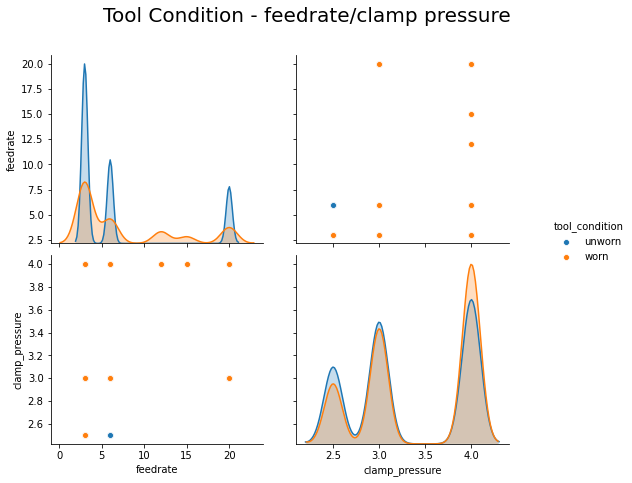

In [28]:
g = sns.pairplot(df, hue='tool_condition', vars=["feedrate","clamp_pressure"])
g.fig.suptitle("Tool Condition - feedrate/clamp pressure", y=1.1, fontsize=20)
g.fig.set_figheight(6)
g.fig.set_figwidth(9)
plt.show()

Default bandwidth for data is 0; skipping density estimation.


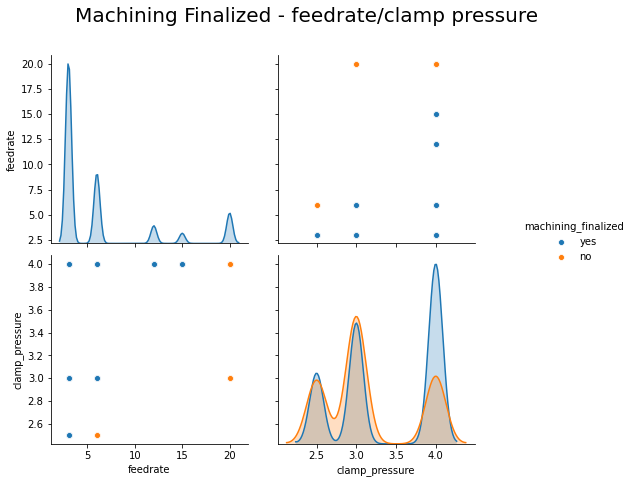

In [29]:
g = sns.pairplot(df, hue='machining_finalized', vars=["feedrate","clamp_pressure"])
g.fig.suptitle("Machining Finalized - feedrate/clamp pressure", y=1.1, fontsize=20)
g.fig.set_figheight(6)
g.fig.set_figwidth(9)
plt.show()

<a href="#top" class="btn btn-success btn-sm active" role="button" aria-pressed="true" style="color:white;">Table of Contents</a>

### Velocity
><div class="alert alert-success" role="alert">
>Machining Finalized
><ul>
><li>distribution of <b>velocity in S axis</b> in machining not finalized experiment has <u>lower kurtosis</u>.</li>
></ul>
></div>

Default bandwidth for data is 0; skipping density estimation.


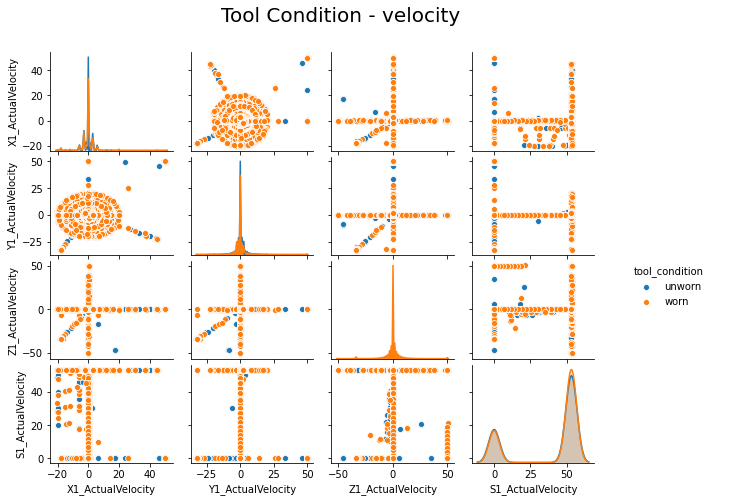

In [30]:
g = sns.pairplot(df, hue='tool_condition', vars=['X1_ActualVelocity','Y1_ActualVelocity','Z1_ActualVelocity','S1_ActualVelocity'])
g.fig.suptitle("Tool Condition - velocity", y=1.1, fontsize=20)
g.fig.set_figheight(6)
g.fig.set_figwidth(9)
g.fig.get_children()[-1].set_bbox_to_anchor((1.1, 0.5, 0, 0))
plt.show()

Default bandwidth for data is 0; skipping density estimation.


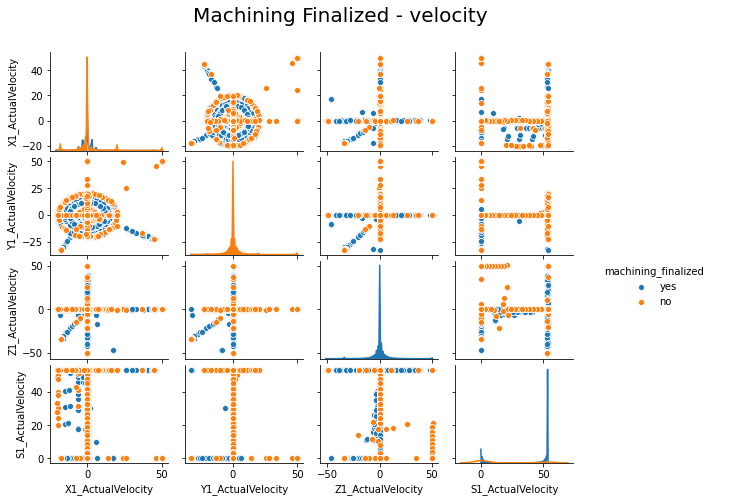

In [31]:
g = sns.pairplot(df, hue='machining_finalized', vars=['X1_ActualVelocity','Y1_ActualVelocity','Z1_ActualVelocity','S1_ActualVelocity'])
g.fig.suptitle("Machining Finalized - velocity", y=1.1, fontsize=20)
g.fig.set_figheight(6)
g.fig.set_figwidth(9)
g.fig.get_children()[-1].set_bbox_to_anchor((1.1, 0.5, 0, 0))
plt.show()

<a href="#top" class="btn btn-success btn-sm active" role="button" aria-pressed="true" style="color:white;">Table of Contents</a>

### Current
><div class="alert alert-success" role="alert">
>Machining Finalized
><ul>
><li>distribution of <b>current in X/Y/S axes</b> in machining not finalized experiment has <u>higher kurtosis</u>.</li>
></ul>
></div>

Data must have variance to compute a kernel density estimate.
Data must have variance to compute a kernel density estimate.


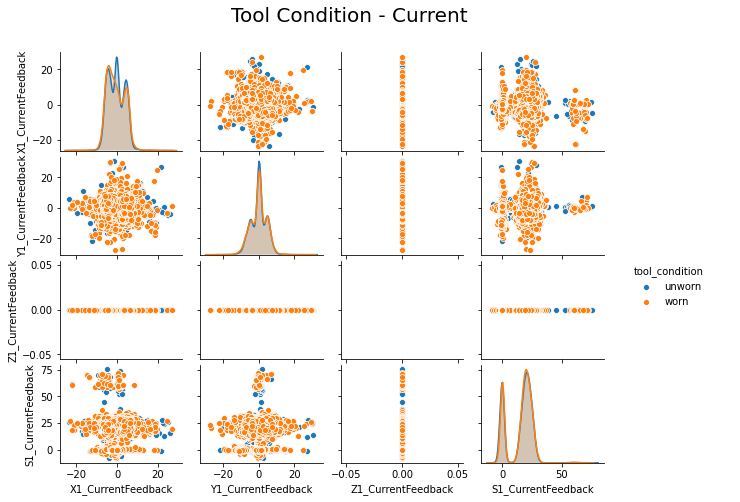

In [32]:
np.seterr(divide='ignore', invalid='ignore')
g = sns.pairplot(df, hue='tool_condition', vars=['X1_CurrentFeedback','Y1_CurrentFeedback','Z1_CurrentFeedback','S1_CurrentFeedback'])
g.fig.suptitle("Tool Condition - Current", y=1.1, fontsize=20)
g.fig.set_figheight(6)
g.fig.set_figwidth(9)
g.fig.get_children()[-1].set_bbox_to_anchor((1.1, 0.5, 0, 0))
plt.show()

Data must have variance to compute a kernel density estimate.
Data must have variance to compute a kernel density estimate.


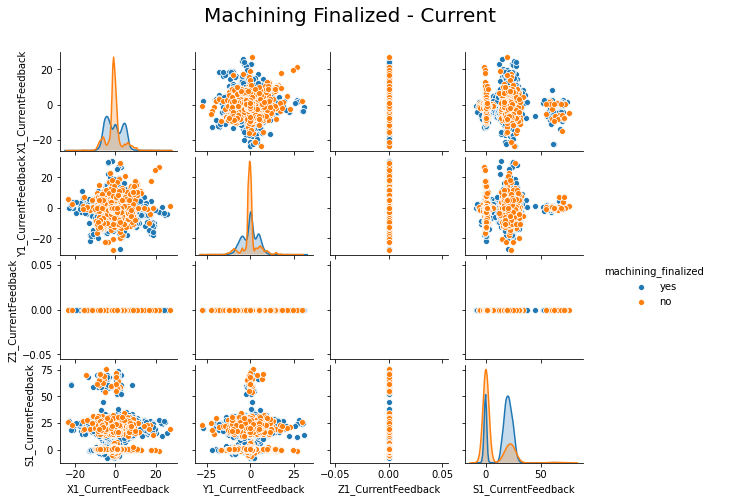

In [33]:
g = sns.pairplot(df, hue='machining_finalized', vars=['X1_CurrentFeedback','Y1_CurrentFeedback','Z1_CurrentFeedback','S1_CurrentFeedback'])
g.fig.suptitle("Machining Finalized - Current", y=1.1, fontsize=20)
g.fig.set_figheight(6)
g.fig.set_figwidth(9)
g.fig.get_children()[-1].set_bbox_to_anchor((1.1, 0.5, 0, 0))
plt.show()

<a href="#top" class="btn btn-success btn-sm active" role="button" aria-pressed="true" style="color:white;">Table of Contents</a>

### Voltage
><div class="alert alert-success" role="alert">
>Machining Finalized
><ul>
><li>distribution of <b>voltage in X/Y/S axes</b> in machining not finalized experiment has <u>higher skewness</u>.</li>
></ul>
></div>

Data must have variance to compute a kernel density estimate.
Data must have variance to compute a kernel density estimate.


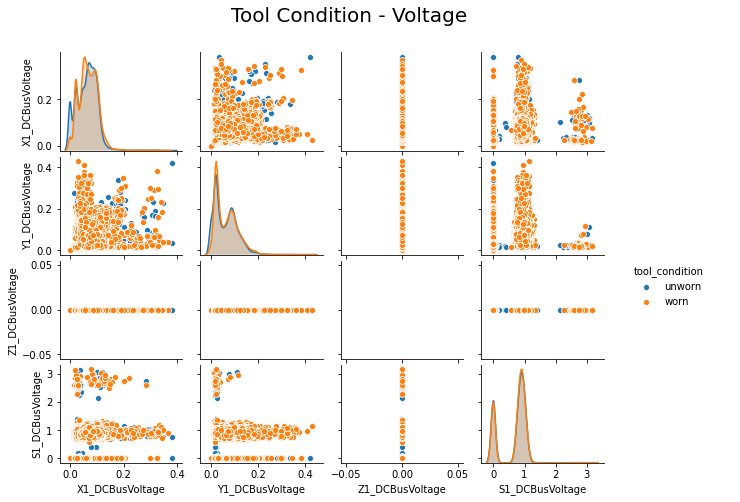

In [34]:
g = sns.pairplot(df, hue='tool_condition', vars=['X1_DCBusVoltage','Y1_DCBusVoltage','Z1_DCBusVoltage','S1_DCBusVoltage'])
g.fig.suptitle("Tool Condition - Voltage", y=1.1, fontsize=20)
g.fig.set_figheight(6)
g.fig.set_figwidth(9)
g.fig.get_children()[-1].set_bbox_to_anchor((1.1, 0.5, 0, 0))
plt.show()

Data must have variance to compute a kernel density estimate.
Data must have variance to compute a kernel density estimate.


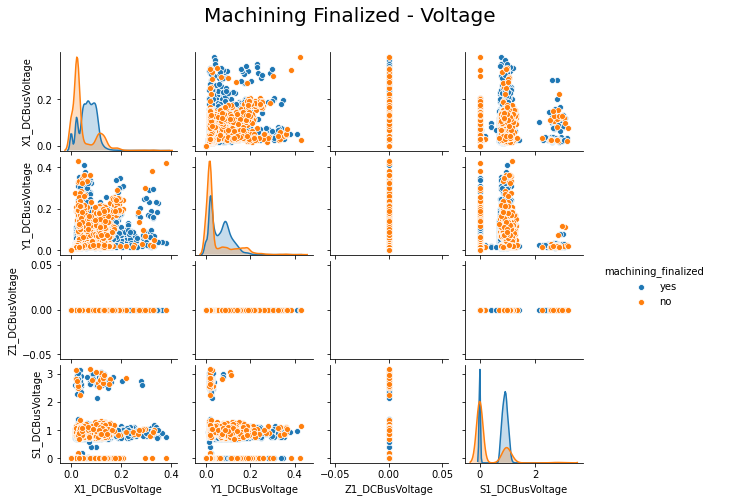

In [35]:
g = sns.pairplot(df, hue='machining_finalized', vars=['X1_DCBusVoltage','Y1_DCBusVoltage','Z1_DCBusVoltage','S1_DCBusVoltage'])
g.fig.suptitle("Machining Finalized - Voltage", y=1.1, fontsize=20)
g.fig.set_figheight(6)
g.fig.set_figwidth(9)
g.fig.get_children()[-1].set_bbox_to_anchor((1.1, 0.5, 0, 0))
plt.show()

<a href="#top" class="btn btn-success btn-sm active" role="button" aria-pressed="true" style="color:white;">Table of Contents</a>

## Frequency Analysis
><div class="alert alert-success" role="alert">
><ul>
><li>experiments which did not finalize machining seem to have high amplitude in certain frequencies.
><li>experiments which did not pass visual inspection seem to have high amplitude in certain frequencies too.
>    <p>this is not so obvious in univariate plot above.<br/>
>       these discoveries observed in frequency analysis can be <u>related to why humans can detect machining failures</u>.</p></li>
></ul>
></div>

> plot function to output all experiment fft result

In [36]:
def plot_fft(col, color='red', peak_thr=1):
    v_list = []
    dt = 0.1 # experiment data was collected per 100ms(0.1sec)
    for i in range(1,19):
        f = df[df['exp_num']==i].reset_index()[col]
        N = len(f)
        t = np.arange(0, N*dt, dt)
        freq = np.linspace(0, 1.0/dt, N)
        F = np.fft.fft(f)
        F_abs = np.abs(F) / (N/2) 
        F_abs[0] = F_abs[0] / 2
        
        maximal_idx = signal.argrelmax(F_abs, order=1)[0] 
        peak_cut = peak_thr
        maximal_idx = maximal_idx[(F_abs[maximal_idx] > peak_cut) & (maximal_idx <= N/2)]
        
        v = hv.Curve((freq[:int(N/2)+1], F_abs[:int(N/2)+1])).opts(title=f"{col} in  experiment {i}", xlabel="Frequency(Hz)", ylabel=f"Amplitude")\
                                                          .opts(width=300, height=150,tools=['hover'],show_grid=True,fontsize=8, color=color)\
            * hv.Scatter((freq[maximal_idx], F_abs[maximal_idx])).opts(color='lime', size=5)
        
        v_list.append(v)
    return (v_list[0] + v_list[1] + v_list[2] + v_list[3] + v_list[4] + v_list[5] + v_list[6] + v_list[7] + v_list[8] + v_list[9] + v_list[10] + v_list[11] + v_list[12]\
            + v_list[13] + v_list[14] + v_list[15] + v_list[16] + v_list[17]).opts(shared_axes=False).cols(6)

### Velocity

In [37]:
plot_fft('X1_ActualVelocity', color='red', peak_thr=3)

:Layout
   .Overlay.I     :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.II    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.III   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.IV    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.V     :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.VI    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.VII   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.VIII  :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.IX    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.X     :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XI    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XII   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XIII  :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XIV   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XV    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XVI   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XVII  :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XVIII :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)

In [38]:
plot_fft('Y1_ActualVelocity', color='orange', peak_thr=3)

:Layout
   .Overlay.I     :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.II    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.III   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.IV    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.V     :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.VI    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.VII   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.VIII  :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.IX    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.X     :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XI    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XII   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XIII  :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XIV   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XV    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XVI   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XVII  :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XVIII :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)

In [39]:
plot_fft('Z1_ActualVelocity', color='green', peak_thr=3)

:Layout
   .Overlay.I     :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.II    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.III   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.IV    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.V     :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.VI    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.VII   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.VIII  :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.IX    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.X     :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XI    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XII   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XIII  :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XIV   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XV    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XVI   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XVII  :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XVIII :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)

In [40]:
plot_fft('S1_ActualVelocity', color='blue', peak_thr=9)

:Layout
   .Overlay.I     :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.II    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.III   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.IV    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.V     :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.VI    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.VII   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.VIII  :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.IX    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.X     :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XI    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XII   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XIII  :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XIV   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XV    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XVI   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XVII  :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XVIII :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)

<a href="#top" class="btn btn-success btn-sm active" role="button" aria-pressed="true" style="color:white;">Table of Contents</a>

### Current

In [41]:
plot_fft('X1_CurrentFeedback', color='red', peak_thr=1.2)

:Layout
   .Overlay.I     :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.II    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.III   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.IV    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.V     :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.VI    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.VII   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.VIII  :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.IX    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.X     :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XI    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XII   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XIII  :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XIV   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XV    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XVI   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XVII  :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XVIII :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)

In [42]:
plot_fft('Y1_CurrentFeedback', color='orange', peak_thr=1.2)

:Layout
   .Overlay.I     :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.II    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.III   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.IV    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.V     :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.VI    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.VII   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.VIII  :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.IX    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.X     :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XI    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XII   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XIII  :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XIV   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XV    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XVI   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XVII  :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XVIII :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)

In [43]:
plot_fft('Z1_CurrentFeedback', color='green', peak_thr=3)

:Layout
   .Overlay.I     :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.II    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.III   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.IV    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.V     :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.VI    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.VII   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.VIII  :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.IX    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.X     :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XI    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XII   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XIII  :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XIV   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XV    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XVI   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XVII  :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XVIII :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)

In [44]:
plot_fft('X1_CurrentFeedback', color='blue', peak_thr=1.2)

:Layout
   .Overlay.I     :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.II    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.III   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.IV    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.V     :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.VI    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.VII   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.VIII  :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.IX    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.X     :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XI    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XII   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XIII  :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XIV   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XV    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XVI   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XVII  :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XVIII :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)

<a href="#top" class="btn btn-success btn-sm active" role="button" aria-pressed="true" style="color:white;">Table of Contents</a>

### Volatage

In [45]:
plot_fft('X1_DCBusVoltage', color='red', peak_thr=0.015)

:Layout
   .Overlay.I     :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.II    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.III   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.IV    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.V     :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.VI    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.VII   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.VIII  :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.IX    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.X     :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XI    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XII   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XIII  :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XIV   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XV    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XVI   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XVII  :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XVIII :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)

In [46]:
plot_fft('Y1_DCBusVoltage', color='orange', peak_thr=0.02)

:Layout
   .Overlay.I     :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.II    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.III   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.IV    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.V     :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.VI    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.VII   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.VIII  :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.IX    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.X     :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XI    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XII   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XIII  :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XIV   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XV    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XVI   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XVII  :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XVIII :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)

In [47]:
plot_fft('Z1_DCBusVoltage', color='green', peak_thr=3)

:Layout
   .Overlay.I     :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.II    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.III   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.IV    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.V     :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.VI    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.VII   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.VIII  :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.IX    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.X     :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XI    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XII   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XIII  :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XIV   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XV    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XVI   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XVII  :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XVIII :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)

In [48]:
plot_fft('S1_DCBusVoltage', color='blue', peak_thr=0.15)

:Layout
   .Overlay.I     :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.II    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.III   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.IV    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.V     :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.VI    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.VII   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.VIII  :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.IX    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.X     :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XI    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XII   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XIII  :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XIV   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XV    :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XVI   :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XVII  :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Overlay.XVIII :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)

<a href="#top" class="btn btn-success btn-sm active" role="button" aria-pressed="true" style="color:white;">Table of Contents</a>

# 6. Modeling
* Target variables :
    * tool_condition
    * machining_finalized
    * passed_visual_inspection
* Through some experiment cases, I examined which features are more important to make robust prediction models.
    * Especially I wanted to know which CNC imformation, for example tool position or current, is most important to detect machine failure.

## Feature Engineering

### Differential Features
<div class="alert alert-success" role="alert">
<ul>
<li>differences between <b>Actual</b> and <b>Command</b> position can indicate <u>a sign of maching failure</u>.</li>
</ul>
</div>

In [49]:
for ax in ['X','Y','Z','S']:
    df[f'{ax}1_Position_Diff'] = abs(df[f'{ax}1_CommandPosition']-df[f'{ax}1_ActualPosition'])
    df[f'{ax}1_Velocity_Diff'] = abs(df[f'{ax}1_CommandVelocity']-df[f'{ax}1_ActualVelocity'])
    df[f'{ax}1_Acceleration_Diff'] = abs(df[f'{ax}1_CommandAcceleration']-df[f'{ax}1_ActualAcceleration'])

### FFT Features
<div class="alert alert-success" role="alert">
<ul>
<li>it is thought that <u>highest frequency and amplitude</u> can be good information to detect machinig failures.</li>
</ul>
</div>

In [50]:
for col in ['ActualPosition','ActualVelocity','ActualAcceleration','CurrentFeedback','DCBusVoltage','OutputCurrent','OutputVoltage','OutputPower']:
    dt = 0.1
    for i in range(1,19):
        for ax in ['X','Y','Z','S']:
            try:
                f = df[df['exp_num']==i].reset_index()[f'{ax}1_{col}']
            except:
                continue
                
            N = len(f)
            t = np.arange(0, N*dt, dt)
            freq = np.linspace(0, 1.0/dt, N)
            F = np.fft.fft(f)
            F_abs = np.abs(F) / (N/2) 
            F_abs[0] = F_abs[0] / 2
            maximal_idx = signal.argrelmax(F_abs, order=1)[0]

            high_amp = np.max(F_abs[maximal_idx]) if len(maximal_idx) > 0 else 0
            high_freq = freq[maximal_idx][np.argmax(F_abs[maximal_idx])] if len(maximal_idx) > 0 else 0

            df.loc[df['exp_num']==i,f'{ax}1_{col}_High_Amp'] = high_amp
            df.loc[df['exp_num']==i,f'{ax}1_{col}_High_Freq'] = high_freq
            df.loc[df['exp_num']==i,f'{ax}1_{col}_High_Amp_Freq'] = high_amp * high_freq

>label encoding & drop unnecessary columns

In [51]:
feature_df = df.copy()
feature_df['Machining_Process'] = LabelEncoder().fit_transform(feature_df['Machining_Process']).astype(np.int8)
feature_df['tool_condition'] = LabelEncoder().fit_transform(feature_df['tool_condition']).astype(np.int8)
feature_df['machining_finalized'] = LabelEncoder().fit_transform(feature_df['machining_finalized']).astype(np.int8)
feature_df['passed_visual_inspection'] = LabelEncoder().fit_transform(feature_df['passed_visual_inspection']).astype(np.int8)
feature_df.drop(['material','exp_num'], axis=1, inplace=True)
feature_df.head(3)

,X1_ActualPosition,X1_ActualVelocity,X1_ActualAcceleration,X1_CommandPosition,X1_CommandVelocity,X1_CommandAcceleration,X1_CurrentFeedback,X1_DCBusVoltage,X1_OutputCurrent,X1_OutputVoltage,...,S1_OutputVoltage_High_Amp_Freq,X1_OutputPower_High_Amp,X1_OutputPower_High_Freq,X1_OutputPower_High_Amp_Freq,Y1_OutputPower_High_Amp,Y1_OutputPower_High_Freq,Y1_OutputPower_High_Amp_Freq,S1_OutputPower_High_Amp,S1_OutputPower_High_Freq,S1_OutputPower_High_Amp_Freq
0,198.0,0.0,0.00,198.0,0.0,0.000000,0.18,0.0207,329.0,2.77,...,0.222398,0.000492,0.199241,0.000098,0.000725,9.867173,0.00715,0.011293,3.358634,0.03793
1,198.0,-10.8,-350.00,198.0,-13.6,-358.000000,-10.90,0.1860,328.0,23.30,...,0.222398,0.000492,0.199241,0.000098,0.000725,9.867173,0.00715,0.011293,3.358634,0.03793
2,196.0,-17.8,-6.25,196.0,-17.9,-0.000095,-8.59,0.1400,328.0,30.60,...,0.222398,0.000492,0.199241,0.000098,0.000725,9.867173,0.00715,0.011293,3.358634,0.03793


## Case1 : Tool Condition

In [52]:
y_series = feature_df['tool_condition']
x_df = feature_df.drop(['tool_condition','machining_finalized','passed_visual_inspection'], axis=1) 
X_train, X_valid, Y_train, Y_valid = train_test_split(x_df, y_series, test_size=0.2, random_state=0, stratify=y_series)

lgb_train = lgb.Dataset(X_train, Y_train)
lgb_valid = lgb.Dataset(X_valid, Y_valid, reference=lgb_train)

In [53]:
params = {
    'task' : 'train',
    'boosting' : 'gbdt',
    'objective': 'binary',
    'metric': 'l2',
    'num_leaves': 200,
    'feature_fraction': 1.0,
    'bagging_fraction': 1.0,
    'bagging_freq': 0,
    'min_child_samples': 5
}
gbm_tool_wear = lgb.train(params,
            lgb_train,
            num_boost_round=100,
            valid_sets=lgb_valid,
            early_stopping_rounds=100)

[LightGBM] [Info] Number of positive: 10646, number of negative: 9582
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012127 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 10481
[LightGBM] [Info] Number of data points in the train set: 20228, number of used features: 138
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.526300 -> initscore=0.105298
[LightGBM] [Info] Start training from score 0.105298
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's l2: 0.202065
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's l2: 0.164086
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's l2: 0.133432
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	valid_0's l2: 0.108622
[LightGBM] [Warning] No further sp

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[74]	valid_0's l2: 8.6678e-08
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[75]	valid_0's l2: 7.09657e-08
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[76]	valid_0's l2: 5.81017e-08
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[77]	valid_0's l2: 4.75695e-08
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[78]	valid_0's l2: 3.89466e-08
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[79]	valid_0's l2: 3.18867e-08
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[80]	valid_0's l2: 2.61066e-08
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[81]	valid_0's l2: 2.13742e-08
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[82]	valid_0's l2: 1.74997e-08
[LightGBM] [Warning] No further splits with pos

In [54]:
feature_imp = pd.DataFrame()
feature_imp['feature'] = gbm_tool_wear.feature_name()
feature_imp['importance'] = gbm_tool_wear.feature_importance()
hv.Bars(feature_imp.sort_values(by='importance', ascending=False)[0:31][::-1]).opts(title="Feature Importance", color="purple", xlabel="Features", ylabel="Importance", invert_axes=True)\
                            .opts(opts.Bars(width=700, height=700, tools=['hover'], show_grid=True))

:Bars   [feature]   (importance)

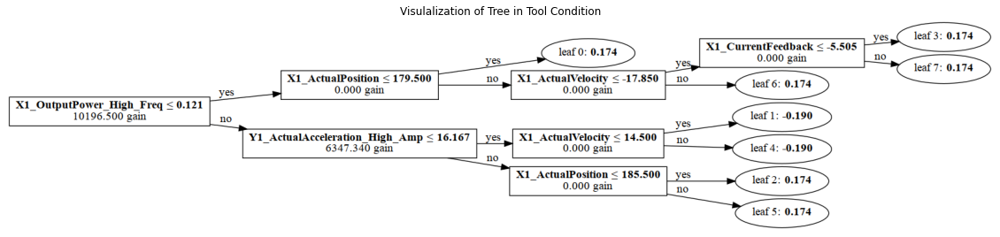

In [55]:
t = lgb.plot_tree(gbm_tool_wear, figsize=(20, 20), precision=3, tree_index=1, show_info=['split_gain'])
plt.title('Visulalization of Tree in Tool Condition')
plt.show()

><div class="alert alert-success" role="alert">
>Feature Importrance top-20
><ol>
><li><font color='red'>X1</font>_Actual<font color='magenta'>Velocity</font></li>
><li><font color='red'>X1</font>_CurrentFeedback</li>
><li><font color='red'>X1</font>_ActualPosition</li>
><li><font color='red'>X1</font>_ActualAcceleration</li>
><li><font color='red'>X1</font>_DCBus<font color='orange'>Voltage</font></li>
><li><font color='red'>X1</font>_Command<font color='magenta'>Velocity</font></li>
><li><font color='blue'>S1</font>_Actual<font color='magenta'>Velocity</font>_<font color='lime'>High_Freq</font></li>
><li><font color='red'>X1</font>_Output<font color='orange'>Voltage</font></li>
><li>Y1_CurrentFeedback</li>
><li><font color='red'>X1</font>_CommandAcceleration</li>
><li><font color='red'>X1</font>_OutputPower</li>
><li><font color='red'>X1</font>_Command<font color='magenta'>Velocity</font></li>
><li><font color='blue'>S1</font>_Actual<font color='magenta'>Velocity</font>_<font color='lime'>High_Freq</font></li>
><li><font color='red'>X1</font>_DCBus<font color='orange'>Voltage</font>_<font color='lime'>High_Freq</font></li>   
><li><font color='red'>X1</font>_Command<font color='magenta'>Velocity</font></li>
><li><font color='blue'>S1</font>_Actual<font color='magenta'>Velocity</font>_<font color='lime'>High_Freq</font></li>
><li><font color='red'>X1</font>_ActualPosition_<font color='lime'>High_Amp_Freq</font></li>
><li><font color='red'>X1</font>_ActualPosition_<font color='lime'>High_Freq</font></li>
><li>Y1_DCBus<font color='orange'>Voltage</font></li>
><li><font color='blue'>S1</font>_ActualAcceleration</li>
></ol>
></div>

<a href="#top" class="btn btn-success btn-sm active" role="button" aria-pressed="true" style="color:white;">Table of Contents</a>

## Case2 : Machining Finalized

In [56]:
y_series = feature_df['machining_finalized']
x_df = feature_df.drop(['tool_condition','machining_finalized','passed_visual_inspection'], axis=1) 
X_train, X_valid, Y_train, Y_valid = train_test_split(x_df, y_series, test_size=0.2, random_state=0, stratify=y_series)

lgb_train = lgb.Dataset(X_train, Y_train)
lgb_valid = lgb.Dataset(X_valid, Y_valid, reference=lgb_train)

In [57]:
params = {
    'task' : 'train',
    'boosting' : 'gbdt',
    'objective': 'binary',
    'metric': 'l2',
    'num_leaves': 200,
    'feature_fraction': 1.0,
    'bagging_fraction': 1.0,
    'bagging_freq': 0,
    'min_child_samples': 5
}
gbm_machining_finalized = lgb.train(params,
            lgb_train,
            num_boost_round=100,
            valid_sets=lgb_valid,
            early_stopping_rounds=100)

[LightGBM] [Info] Number of positive: 18499, number of negative: 1729
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 10506
[LightGBM] [Info] Number of data points in the train set: 20228, number of used features: 138
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.914524 -> initscore=2.370173
[LightGBM] [Info] Start training from score 2.370173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's l2: 0.055917
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's l2: 0.0443281
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's l2: 0.0355696
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	valid_0's l2: 0.0287056
[LightGBM] [Warning] No further

In [58]:
feature_imp = pd.DataFrame()
feature_imp['feature'] = gbm_machining_finalized.feature_name()
feature_imp['importance'] = gbm_machining_finalized.feature_importance()
hv.Bars(feature_imp.sort_values(by='importance', ascending=False)[0:31][::-1]).opts(title="Feature Importance", color="purple", xlabel="Features", ylabel="Importance", invert_axes=True)\
                            .opts(opts.Bars(width=700, height=700, tools=['hover'], show_grid=True))

:Bars   [feature]   (importance)

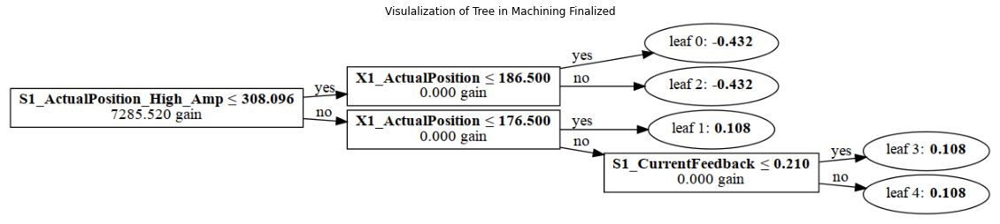

In [59]:
t = lgb.plot_tree(gbm_machining_finalized, figsize=(20, 20), precision=3, tree_index=1, show_info=['split_gain'])
plt.title('Visulalization of Tree in Machining Finalized')
plt.show()

><div class="alert alert-success" role="alert">
>Feature Importrance top-20
><ol>
><li><font color='red'>X1</font>_ActualVelocity</li>
><li><font color='red'>X1</font>_CurrentFeedback</li>
><li><font color='red'>X1</font>_Actual<font color='magenta'>Position</font></li>
><li><font color='red'>X1</font>_ActualAcceleration</li>
><li><font color='red'>X1</font>_DCBus<font color='orange'>Voltage</font></li>
><li><font color='red'>X1</font>_Output<font color='orange'>Voltage</font></li>
><li>S1_Actual<font color='magenta'>Position</font>_<font color='lime'>High_Amp</font></li>
><li><font color='red'>X1</font>_OutputPower</li>
><li><font color='blue'>Y1</font>_Output<font color='orange'>Voltage</font></li>
><li><font color='blue'>Y1</font>_CurrentFeedback</li>
><li><font color='blue'>Y1</font>_ActualVelocity</li>
><li><font color='red'>X1</font>_CommandVelocity</li>
><li><font color='blue'>Y1</font>_DCBus<font color='orange'>Voltage</font></li>
><li><font color='red'>X1</font>_CommandAcceleration</li>   
><li>S1_Actual<font color='magenta'>Position</font></li>
><li><font color='blue'>Y1</font>_Actual<font color='magenta'>Position</font></li>
><li><font color='red'>X1</font>_Command<font color='magenta'>Position</font></li>
><li>S1_CurrentFeedback</li>
><li>S1_ActualAcceleration</li>
><li><font color='blue'>Y1</font>_OutputPower</li>
></ol>
></div>

<a href="#top" class="btn btn-success btn-sm active" role="button" aria-pressed="true" style="color:white;">Table of Contents</a>

## Case3 : Passed Visual Inspection

In [60]:
y_series = feature_df['passed_visual_inspection']
x_df = feature_df.drop(['tool_condition','machining_finalized','passed_visual_inspection'], axis=1) 
X_train, X_valid, Y_train, Y_valid = train_test_split(x_df, y_series, test_size=0.2, random_state=0, stratify=y_series)

lgb_train = lgb.Dataset(X_train, Y_train)
lgb_valid = lgb.Dataset(X_valid, Y_valid, reference=lgb_train)

In [61]:
params = {
    'task' : 'train',
    'boosting' : 'gbdt',
    'objective': 'binary',
    'metric': 'l2',
    'num_leaves': 200,
    'feature_fraction': 1.0,
    'bagging_fraction': 1.0,
    'bagging_freq': 0,
    'min_child_samples': 5
}
gbm_passed_vis_inspection = lgb.train(params,
            lgb_train,
            num_boost_round=100,
            valid_sets=lgb_valid,
            early_stopping_rounds=100)

[LightGBM] [Info] Number of positive: 15346, number of negative: 4882
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 10484
[LightGBM] [Info] Number of data points in the train set: 20228, number of used features: 138
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.758651 -> initscore=1.145300
[LightGBM] [Info] Start training from score 1.145300
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's l2: 0.146059
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's l2: 0.117591
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's l2: 0.0951075
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	valid_0's l2: 0.0771371
[LightGBM] [Warning] No further 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[84]	valid_0's l2: 8.20961e-09
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[85]	valid_0's l2: 6.72145e-09
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[86]	valid_0's l2: 5.50305e-09
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[87]	valid_0's l2: 4.50551e-09
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[88]	valid_0's l2: 3.6888e-09
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[89]	valid_0's l2: 3.02013e-09
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[90]	valid_0's l2: 2.47267e-09
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[91]	valid_0's l2: 2.02445e-09
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[92]	valid_0's l2: 1.65748e-09
[LightGBM] [Warning] No further splits with pos

In [62]:
feature_imp = pd.DataFrame()
feature_imp['feature'] = gbm_passed_vis_inspection.feature_name()
feature_imp['importance'] = gbm_passed_vis_inspection.feature_importance()
hv.Bars(feature_imp.sort_values(by='importance', ascending=False)[0:31][::-1]).opts(title="Feature Importance", color="purple", xlabel="Features", ylabel="Importance", invert_axes=True)\
                            .opts(opts.Bars(width=700, height=700, tools=['hover'], show_grid=True))

:Bars   [feature]   (importance)

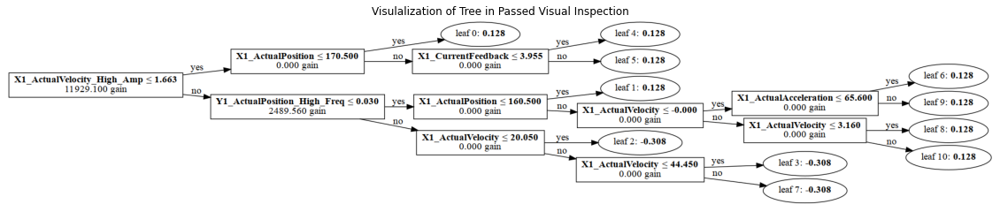

In [63]:
t = lgb.plot_tree(gbm_passed_vis_inspection, figsize=(20, 20), precision=3, tree_index=1, show_info=['split_gain'])
plt.title('Visulalization of Tree in Passed Visual Inspection')
plt.show()

><div class="alert alert-success" role="alert">
>Feature Importrance top-20
><ol>
><li><font color='red'>X1</font>_Actual<font color='magenta'>Velocity</font></li>
><li><font color='red'>X1</font>_CurrentFeedback</li>
><li><font color='red'>X1</font>_ActualPosition</li>
><li><font color='red'>X1</font>_DCBus<font color='orange'>Voltage</font></li>
><li><font color='red'>X1</font>_ActualAcceleration</li>
><li><font color='red'>X1</font>_Output<font color='orange'>Voltage</font></li>
><li><font color='red'>X1</font>_Actual<font color='magenta'>Velocity</font>_<font color='lime'>High_Amp</font></li>
><li><font color='blue'>Y1</font>_CurrentFeedback</li>
><li>Z1_ActualPosition_<font color='lime'>High_Amp</font></li>
><li><font color='red'>X1</font>_CommandAcceleration</li>
><li><font color='blue'>Y1</font>_Output<font color='orange'>Voltage</font></li>
><li><font color='red'>X1</font>_Command<font color='magenta'>Velocity</font></li>
><li><font color='red'>X1</font>_OutputPower</li>
><li><font color='blue'>Y1</font>_DCBus<font color='orange'>Voltage</font></li>
><li>S1_ActualAcceleration</li>
><li>S1_ActualPosition</li>
><li><font color='blue'>Y1</font>_Actual<font color='magenta'>Velocity</font></li>
><li>S1_OutputPower</li>
><li><font color='blue'>Y1</font>_Command<font color='magenta'>Velocity</font></li>
><li><font color='blue'>Y1</font>_OutputPower</li>
></ol>
></div>

<a href="#top" class="btn btn-success btn-sm active" role="button" aria-pressed="true" style="color:white;">Table of Contents</a>

# 7. Conclusion
><div class="alert alert-success" role="alert">
><h4>Tool Wear</h4>
><ul>
>    <li><b>X-axis</b> and <b>S-axis</b> data have a great influence to tool wears, and the movement of X-axis and S-axis can be a bad affect to tool wear.</li>
>    <li><b>Velocity</b> and <b>voltage</b> have a large influence in the collected data.</li>
>    <li>A certain number of features created by <b>FFT</b> are also included in the top of feature importances, and it is considered that <u>tool wear increased the amplitude in the specific frequency range</u>.</li>
></ul>   
><br/>
><h4>Machining Finalized</h4>
><ul>
>    <li><b>X-axis</b> and <b>Y-axis</b> data have a great influence to tool wears, and the movement of X-axis and Y-axis can be a bad affect to machining process.</li>
>    <li><b>Position</b> and <b>voltage</b> have a large influence in the collected data.</li>
></ul>    
><br/>  
><h4>Passed Visual Inspection</h4>
><ul>
>    <li><b>X-axis</b> and <b>Y-axis</b> data have a great influence to tool wears, and the movement of X-axis and Y-axis may be a bad affect to machining process.</li>
>    <li><b>Velocity</b> and <b>voltage</b> have a large influence in the collected data.</li>
>    <li>The importance of features created by <b>FFT</b> increased compared to Machining Finalized case.
        <p>It is considered that the influence of tool weariness to the specific frequency range is <u>related to an external processing result that can be detected by humans</u>.</p></li>
></ul>
><br/>
><h4>Others</h4>
><ul>
>    <li>Through all the experiment, there is almost no importance in Z-axis data.</li>
>    <li>The <b>differential features</b> do not have a large influence on the detection of anomalies throughout, and it is thought that <u>the difference between the command and the actual position was negligibly small for tool wear and machining process</u> in most cases.</li>
></ul>
><br/>  
><p>In order to proceed to more detailed analysis, it is necessary to deepen the understanding of the operating principles of processing machines.</p>
><br/> 
></div>

<a href="#top" class="btn btn-success btn-sm active" role="button" aria-pressed="true" style="color:white;">Table of Contents</a>

# 8. References
>* **Seaborn Tricks**  
>https://catherineh.github.io/programming/2016/05/24/seaborn-pairgrid-tips
>* **Numpy FFT Tricks**  
>https://stackoverflow.com/questions/25735153/plotting-a-fast-fourier-transform-in-python
>* **LightGBM Parameter List**  
>https://lightgbm.readthedocs.io/en/latest/Parameters.html
>* **Introduction of CNC anomaly detection**  
>https://medium.com/machinemetrics-techblog/using-pca-and-clustering-to-detect-machine-anomalies-part-1-ba89f6a6a8cd
>* **SHAP README**  
>https://github.com/slundberg/shap

<a href="#top" class="btn btn-success btn-sm active" role="button" aria-pressed="true" style="color:white;">Table of Contents</a>